# COVID-19-EU - Last 60 Days Daily Evolution  

<div style="float:right; a.color: grey;">
    <a href="https://github.com/matosdotnet">
        <img src="https://avatars3.githubusercontent.com/u/64945038?s=60&v=4">
        matosdotnet
    </a>
</div>

<ul> 
        <li>New Cases</li>
        <li>New Deaths</li>
        <li>New Suspects</li>
        <li>New Recovered</li>
      </ul>
       Data Source: 
        <a href="https://opendata.ecdc.europa.eu/covid19/casedistribution/csv">https://opendata.ecdc.europa.eu/covid19/casedistribution/csv</a>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import datetime
%matplotlib inline

# Define the last number of days here
nr_last_days = 60
#List of Countries to visualize
l_countries = ['Portugal','Spain','Switzerland','Sweden','Italy','Greece','Slovenia','Bulgaria']

s_title = 'COVID-19 EU'
s_url = 'https://opendata.ecdc.europa.eu/covid19/casedistribution/csv'
s_url_confirmations = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
s_url_deaths = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
s_url_recoveries = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
s_local_snapshot_path = 'data-eu.csv'

In [2]:
#define dictionaries with metadata
d_confirmations = {'key' : 'cases', 'label' : 'Cases', 'color' : '#00D0FE'}
d_new_confirmations = {'key' : 'cases_new', 'label' : 'New Cases', 'color' : '#00D0FE'}

d_deaths = {'key' : 'deaths', 'label' : 'Deaths', 'color' : '#FE0004'}
d_new_deaths = {'key' : 'deaths_new', 'label' : 'New Deaths', 'color' : '#FE0004'}

#d_recoveries = {'key' : 'recoveries', 'label' : 'Recoveries', 'color' : '#7FFE00'}
#d_new_recoveries = {'key' : 'recoveries_new', 'label' : 'New Recoveries', 'color' : '#7FFE00'}

#d_active = {'key' : 'active', 'label' : 'Active', 'color' : '#FE0004'}
#d_new_active = {'key' : 'active_new', 'label' : 'New Active', 'color' : '#FE00F6'}

In [3]:
def read_data_remote():
    # Read Source Data
    df_full =  pd.read_csv(s_url)
    #transform 
    df_full['id'] = df_full[['countriesAndTerritories','geoId','countryterritoryCode','continentExp']].apply(lambda x : '{}_{}_{}_{}'.format(
                                                                                                x['countriesAndTerritories']
                                                                                               ,x['geoId']
                                                                                               ,x['countryterritoryCode']
                                                                                               ,x['continentExp']
                                                                                               ),axis=1) 
    # Manage Dates Formating - EU date is onde day advanced to the reported data therefore 1 days is deducted
    df_full['dateRep'] = df_full['dateRep'].apply(lambda x : pd.to_datetime(x,format='%d/%m/%Y')-datetime.timedelta(days=1)) 
    # New Confirmations, Deaths   
    df_full = df_full.sort_values(by=['id', 'dateRep'])
    #df_full[[d_new_confirmations['key'], d_new_deaths['key']]] = df_full.groupby(['id'])[[d_confirmations['key'], d_deaths['key']]].diff().fillna(0)
    df_full[[d_new_confirmations['key'], d_new_deaths['key']]] = df_full[[d_confirmations['key'], d_deaths['key']]]
    #Set Index
    df_full = df_full.set_index(['dateRep'])
    
    #Fill Null values
    df_full.fillna(value=0, inplace=True)
    #save locally
    df_full.to_csv(s_local_snapshot_path)
    return df_full

def read_data_local() :  
    df_full = pd.read_csv(s_local_snapshot_path)
    df_full['dateRep'] = df_full['dateRep'].apply(lambda x : pd.to_datetime(x))
    df_full = df_full.set_index(['dateRep'])
    return df_full 

def read_data() :
    df_full = pd.DataFrame()
    try:
        df_full = read_data_remote()
    except:
        df_full = read_data_local()
        print("An exception occurred reading data from \n{}Alternatively the latest Snapshot from {} was retrieved.".format(s_url,df_full.index.max()))
    else:
         print("Data collected sucessfully from: \n{}\nMax data set date: {}".format(s_url,df_full.index.max()))
    return df_full

def get_country_df(country_name,df = pd.DataFrame()):   
    df_country = df[df['countriesAndTerritories']==country_name].reset_index().groupby(['dateRep','countriesAndTerritories']).sum()
    df_country = df_country.reset_index()
    df_country = df_country.set_index('dateRep')
    return df_country

In [4]:
#Read Data
df_full  = read_data()
#df_full  = read_data_local()

Data collected sucessfully from: 
https://opendata.ecdc.europa.eu/covid19/casedistribution/csv
Max data set date: 2020-05-27 00:00:00


In [5]:
#Slice and Groupy
df_latest = df_full[df_full['countriesAndTerritories'].isin(l_countries)]
#Drop Columns not needed
df_latest.drop(['geoId','countryterritoryCode','continentExp'],axis=1, inplace=True)
#Create Tailored Data Frames
df_latest_collection = {} 
for c in df_latest['countriesAndTerritories'].unique() :
    df_latest_collection[c] = get_country_df(c,df_latest).tail(nr_last_days)
#Create Tailored Data Frames in one
df_latest = pd.concat(df for df in df_latest_collection.values()) 

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [6]:
#Latest Row per country
df_latest.groupby('countriesAndTerritories').tail(1)

,countriesAndTerritories,day,month,year,cases,deaths,popData2018,cases_new,deaths_new
dateRep,,,,,,,,,
2020-05-27,Bulgaria,28,5,2020,0,0,7024216.0,0,0
2020-05-27,Greece,28,5,2020,11,0,10727668.0,11,0
2020-05-27,Italy,28,5,2020,584,117,60431283.0,584,117
2020-05-27,Portugal,28,5,2020,285,14,10281762.0,285,14
2020-05-27,Slovenia,28,5,2020,2,1,2067372.0,2,1
2020-05-26,Spain,27,5,2020,510,1,46723749.0,510,1
2020-05-27,Sweden,28,5,2020,648,95,10183175.0,648,95
2020-05-27,Switzerland,28,5,2020,0,0,8516543.0,0,0


In [7]:
df_latest.groupby('countriesAndTerritories')[[d_new_confirmations['key'],d_new_deaths['key']]].describe().transpose()

countriesAndTerritories   Bulgaria      Greece        Italy     Portugal  \
cases_new  count         60.000000   60.000000    60.000000    60.000000   
           mean          35.483333   30.700000  2311.116667   435.366667   
           std           21.485108   34.335977  1457.447096   290.737109   
           min            0.000000    0.000000   300.000000  -161.000000   
           25%           23.750000    8.500000   884.750000   222.000000   
           50%           33.000000   17.000000  2088.500000   366.000000   
           75%           46.000000   44.500000  3519.500000   639.250000   
           max           91.000000  156.000000  5217.000000  1516.000000   
deaths_new count         60.000000   60.000000    60.000000    60.000000   
           mean           2.100000    2.350000   384.150000    20.933333   
           std            1.653963    2.169316   218.381630    10.621160   
           min            0.000000    0.000000    50.000000     0.000000   
           25%            1.000000    1.000000   177.750000    13.750000   
           50%            2.000000    2.000000   375.500000    19.500000   
           75%            3.000000    4.000000   565.500000    28.250000   
           max            6.000000    9.000000   839.000000    60.000000   

countriesAndTerritories   Slovenia        Spain      Sweden  Switzerland  
cases_new  count         60.000000    60.000000   60.000000    60.000000  
           mean          13.000000  2548.066667  527.350000   292.100000  
           std           15.049072  2304.439370  150.298553   337.870836  
           min            0.000000  -713.000000  234.000000     0.000000  
           25%            1.000000   649.750000  403.250000    43.000000  
           50%            5.500000  1650.500000  531.500000   149.000000  
           75%           21.000000  3851.750000  648.250000   436.500000  
           max           56.000000  8145.000000  812.000000  1138.000000  
deaths_new count         60.000000    60.000000   60.000000    60.000000  
           mean           1.633333   371.000000   68.633333    23.533333  
           std            1.646431   409.431727   46.012882    20.833860  
           min            0.000000 -1918.000000    2.000000     0.000000  
           25%            0.000000   164.000000   31.000000     6.000000  
           50%            1.000000   372.500000   67.000000    18.500000  
           75%            2.000000   633.250000   96.750000    41.250000  
           max            6.000000   950.000000  185.000000    78.000000

In [8]:
def line_plot_df_tindex(y,data,title,ylabel,ycolor,window_span=7,bollinger_type='EMA'):
    '''
    bollinger_type: 
                    'EMA' Exponential moving average
                    'MA' Moving average
    '''
    #Mean ans Standar Deviations
    v_mean = data[y].mean()
    v_std =  data[y].std()
    
    v_df_averages    = pd.Series([], dtype= 'float64')
    v_df_upper_stds  = pd.Series([], dtype= 'float64')
    v_df_lower_stds  = pd.Series([], dtype= 'float64')
    
    if bollinger_type == 'MA': 
        v_df_averages = data[y].rolling(window=window_span).mean()
        v_df_upper_stds = v_df_averages + 2*data[y].rolling(window=window_span).std()
        v_df_lower_stds = v_df_averages - 2*data[y].rolling(window=window_span).std()
    elif bollinger_type == 'EMA': 
        v_df_averages = data[y].ewm(span=window_span).mean()
        v_df_upper_stds = v_df_averages + 2*data[y].ewm(span=window_span).std()
        v_df_lower_stds = v_df_averages - 2*data[y].ewm(span=window_span).std()
    else :
        return 0
    
    #Set Style
    sns.set_style('darkgrid', 
              {
                  'axes.facecolor': '#646666',
                  'figure.facecolor': '#646666',
                  'grid.color': 'lightgrey',
                  'grid.linestyle': 'dotted',
                  'xtick.color': 'white',
                  'xtick.top': False,
                  'xtick.bottom': True,
                  'ytick.color': 'white',
                  'ytick.left': True,
                  'ytick.right': False,
                  'axes.labelcolor': 'white',
                  'axes.spines.top': False,
                  'axes.spines.right': False,
                  'text.color': 'white'
                  
              })
 
    #Set Fig Size
    fig = plt.figure(figsize=(12,5))

    ax = sns.lineplot(x=data.index,y=v_df_averages
                      ,color = '#5CFE00'
                      ,alpha = 0.2        
                      ,dashes=True
                     # ,estimator = 'mean'
                     )
    
    #Line Plots for Mean and Standard Deviation
    ax = sns.lineplot(x=data.index,y=v_df_upper_stds
                      ,color = '#5CFE00'
                      ,alpha = 0.2        
                      ,dashes=True
                     # ,estimator = 'mean'
                     )
    
    ax.lines[1].set_linestyle('dotted')    
    ax = sns.lineplot(x=data.index,y=v_df_lower_stds
                      ,color = '#5CFE00'
                      ,alpha = 0.2        
                      ,dashes=True
                     # ,estimator = 'mean'
                     )
    ax.lines[2].set_linestyle('dotted')
    
    #Line Plot with data

    ax = sns.lineplot(x=data.index,y=data[y]
                      ,marker=True
                      ,markers=["o", "o"]
                      ,alpha = 0.5
                      ,dashes=False
                      ,style=True
                      ,hue = 1
                      ,palette = [ycolor]
                     # ,estimator = 'mean'
                     )

    # Rerieve Max, Min and Latest
    y_max = data[y].max()
    x_max = data[[y]].idxmax()[0]
    y_min = data[y].min()
    x_min = data[[y]].idxmin()[0]
    y_mean = y_max+y_max*0.10
    x_mean = data[[y]].index[0]
    x_latest =  data.index.max()
    y_latest = data[x_latest:x_latest][y][0]

    # Slice the chart canvas
    ax.set_xlim(data.index.min(), data.index.max()+datetime.timedelta(days=1))
      
    if y_min >= 0 :
        ax.set_ylim(0, y_max+y_max*0.10)
    else :
        ax.set_ylim(y_min+y_min*0.10, y_max+y_max*0.10)

    #Set Date Format
    str_date_format = '%d/%m'

    #Anotattions for Max, Min and Latest
    lbl_y_offset = 0.02*y_max
    lbl_y_max_offset = 0.02*y_max
    lbl_y_min_offset = 0.02*y_min

    ax.annotate('  MAX: {0:.0f} \n {1}'.format(y_max,x_max.strftime(str_date_format))
                ,xy=(x_max,y_max)
                ,xytext=(x_max,y_max+lbl_y_max_offset)
                ,ha='center')
    
    if (x_min != x_max) :
        ax.annotate('  MIN: {0:.0f} \n {1}'.format(y_min,x_min.strftime(str_date_format))
                ,xy=(x_min,y_min)
                ,xytext=(x_min,y_min+lbl_y_min_offset)
                ,ha='center')

    if (x_latest != x_max) and (x_latest!= x_min) :
        ax.annotate('  {0:.0f} \n {1}'.format(y_latest,x_latest.strftime(str_date_format))
                ,xy=(x_latest,y_latest)
                ,xytext=(x_latest,y_latest+lbl_y_offset)
                ,ha='center')
    
    plt.figtext(0.1, 0.05,'x̄: {0:.1f} σ: {1:.1f} : {2}[x̄ +- 2σ] N={3:.0f}'.format(v_mean,v_std,bollinger_type,window_span)
               #,ha='right'
               ,color='#5CFE00') 
    
    #Axis and Labels formating
    ax.set_title(title)
    
    #Make sure the dataset has continuous dates in the DataFrame
    ax.set_xlabel('Last {0} days'.format(len(data.index)))
    ax.set_ylabel(ylabel)

    myFmt = mdates.DateFormatter(str_date_format)
    ax.xaxis.set_major_formatter(myFmt)
    ax.legend().remove()

    # Fill Area
    plt.fill_between( data.index, data[y], color=ycolor, alpha=0.2)
    
    #fig.savefig("{}.png".format(title),bbox_inches = 'tight', dpi=plt.gcf().dpi,facecolor='#646666')
    fig.savefig("{}.png".format(title),bbox_inches = 'tight', dpi=300,facecolor='#646666')
    
    plt.show()

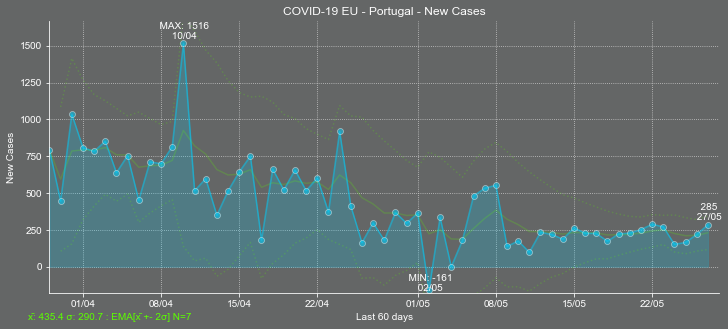

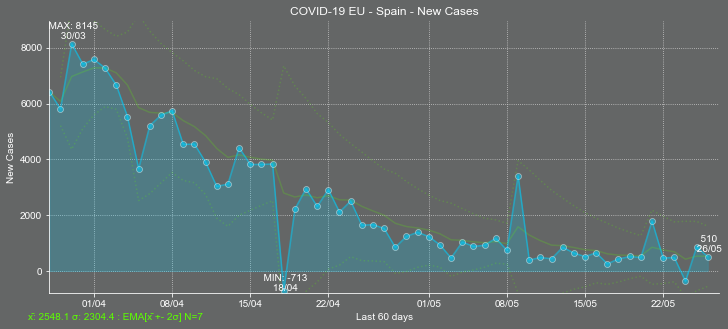

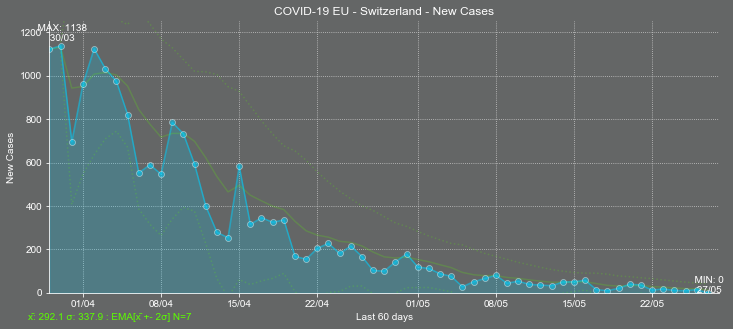

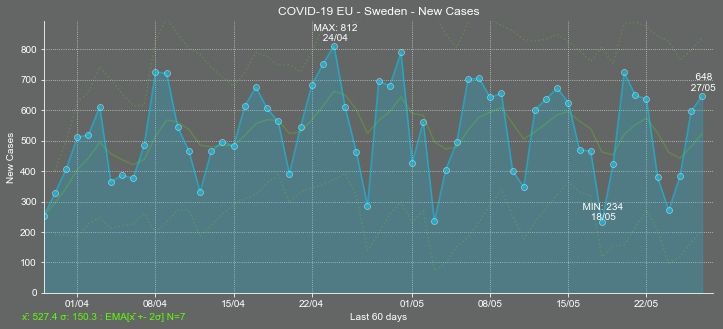

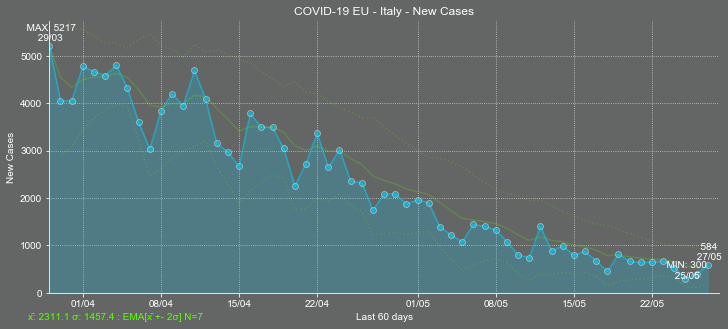

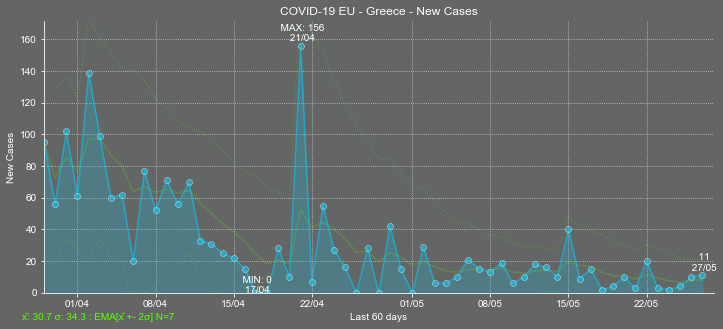

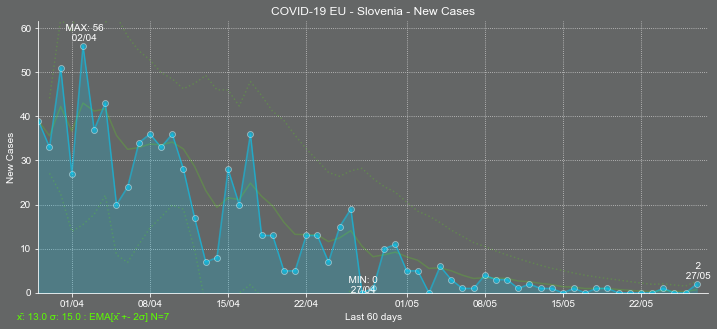

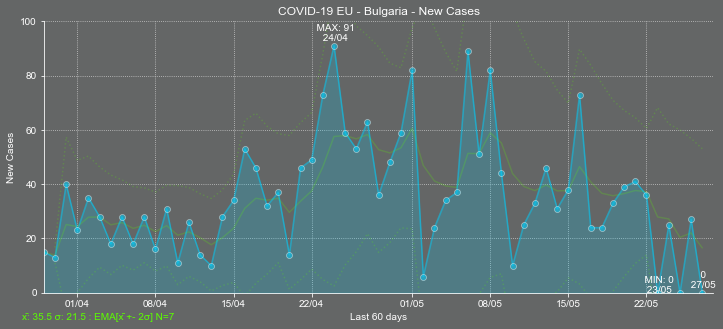

In [9]:
#from MatosDotNetStandardCharts import line_plot_df_tindex 
#for df in df_latest_collection.values() :
for c  in l_countries :
    df = df_latest[df_latest['countriesAndTerritories']==c]
    line_plot_df_tindex(
                d_new_confirmations['key']
                ,data=df
                ,title='{} - {} - {}'.format(s_title,df['countriesAndTerritories'].unique()[0],d_new_confirmations['label'])
                ,ylabel=d_new_confirmations['label']
                ,ycolor=d_new_confirmations['color']
               )

In [10]:
df_latest[df_latest['countriesAndTerritories']=='Portugal'][[d_confirmations['key'],d_new_confirmations['key']]]['2020-05-01':'2020-05-02']

,cases,cases_new
dateRep,,
2020-05-01,364,364
2020-05-02,-161,-161


[Relatório de Situação nº 060 | 01/05/2020](https://covid19.min-saude.pt/wp-content/uploads/2020/05/60_DGS_boletim_20200501_NOVO_05_05.pdf)

In [11]:
# Trace outstanding vales
df_latest[df_latest['countriesAndTerritories']=='Portugal'][[d_confirmations['key'],d_new_confirmations['key']]]['2020-04-09':'2020-04-11']

,cases,cases_new
dateRep,,
2020-04-09,815,815
2020-04-10,1516,1516
2020-04-11,515,515


<a href="https://covid19.min-saude.pt/wp-content/uploads/2020/04/39_DGS_boletim_20200410.pdf">Relatório de Situação nº 039 | 10/04/2020</a>
<br/>
    <a href="https://www.publico.pt/2020/04/10/sociedade/noticia/covid19-ha-26-mortes-1516-infectados-portugal-1911826">Covid-19: há mais 26 mortes e mais 1516 infectados em Portugal<a/>
    <br/>
    <a href="https://www.jornaldenegocios.pt/economia/coronavirus/detalhe/morreram-mais-26-pessoas-em-portugal-com-covid-19-e-casos-confirmados-aumentam-mais-de-10">Morreram mais 26 pessoas em Portugal com covid-19 e casos confirmados aumentam mais de 10%</a>

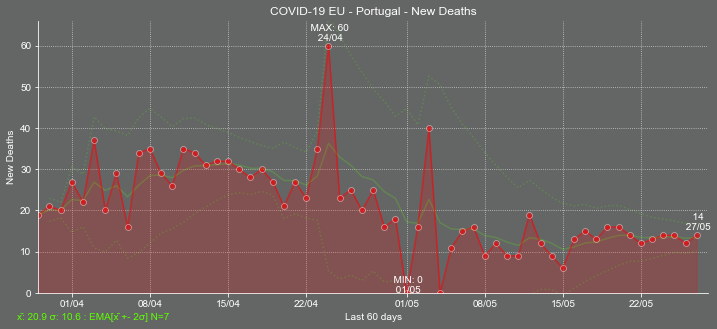

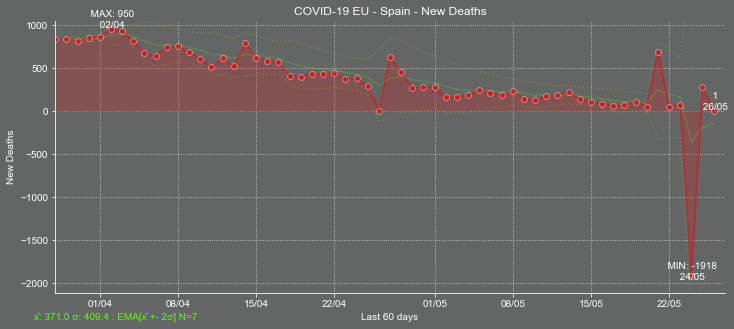

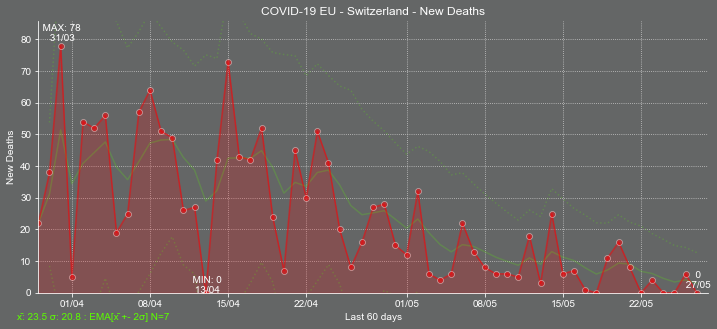

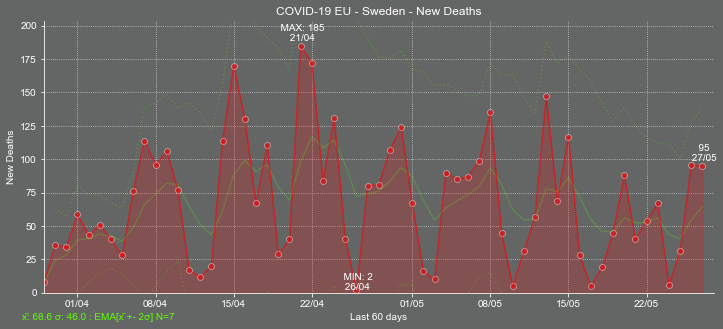

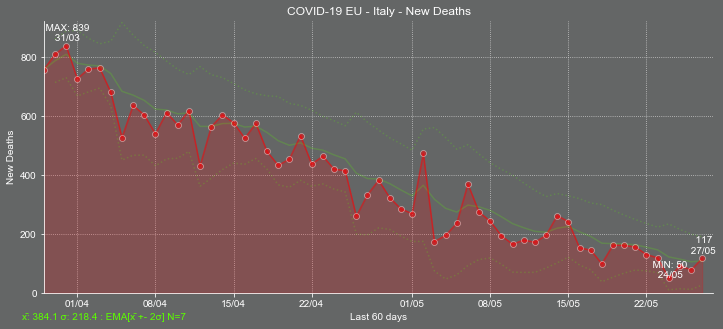

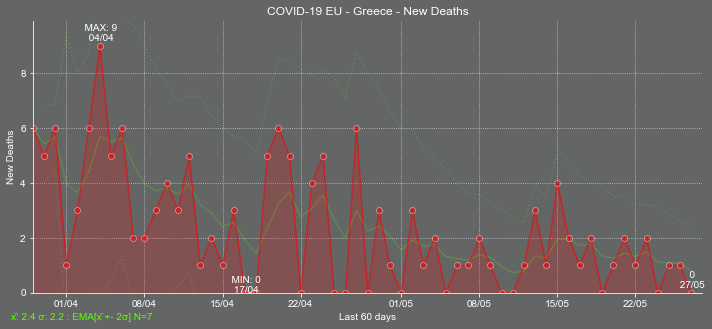

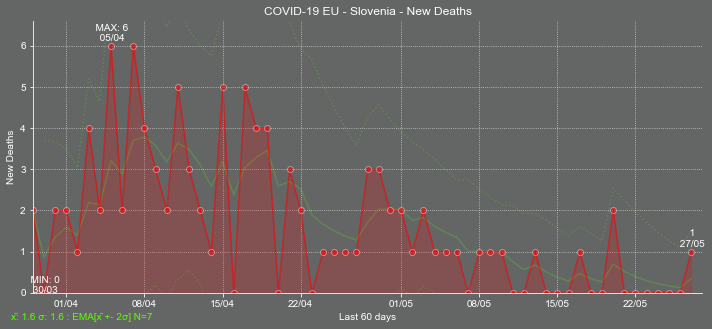

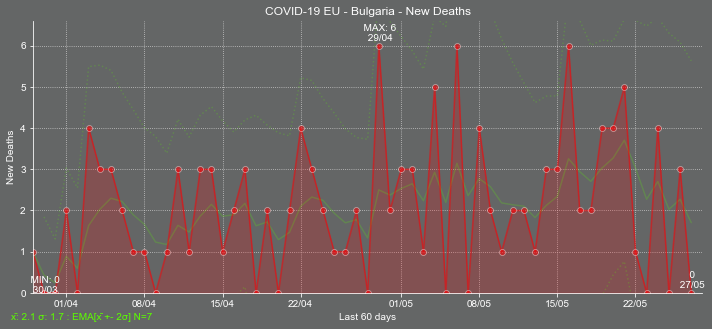

In [12]:
for c  in l_countries :
    df = df_latest[df_latest['countriesAndTerritories']==c]
    line_plot_df_tindex(
                d_new_deaths['key']
                ,data=df
                ,title='{} - {} - {}'.format(s_title,df['countriesAndTerritories'].unique()[0],d_new_deaths['label'])
                ,ylabel=d_new_deaths['label']
                ,ycolor=d_new_deaths['color']
               )

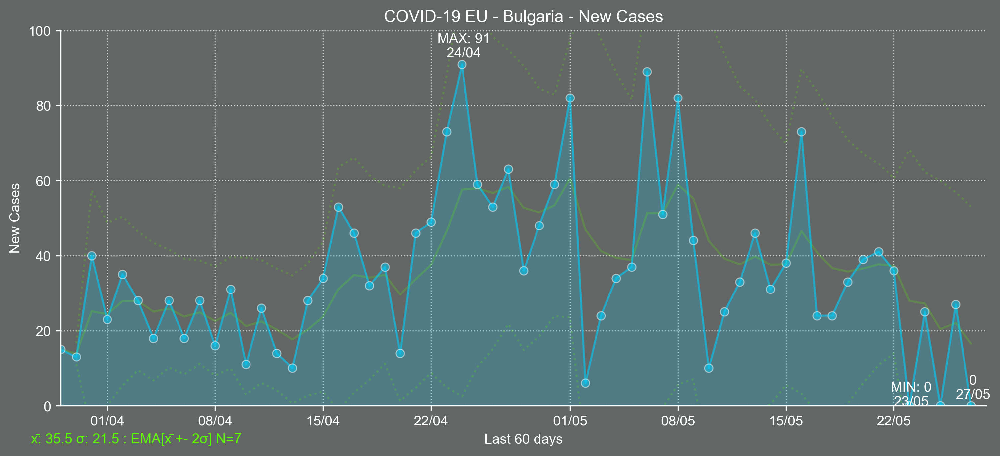

COVID-19 EU - Bulgaria - New Cases.png


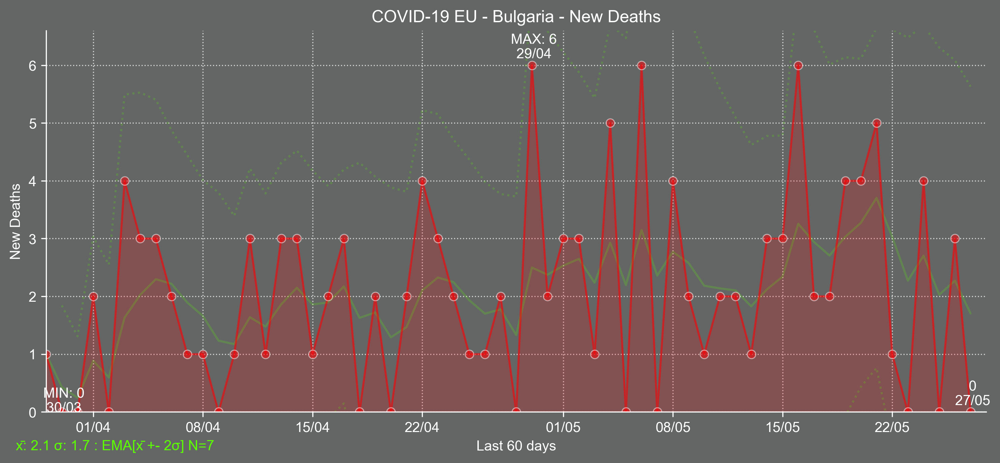

COVID-19 EU - Bulgaria - New Deaths.png


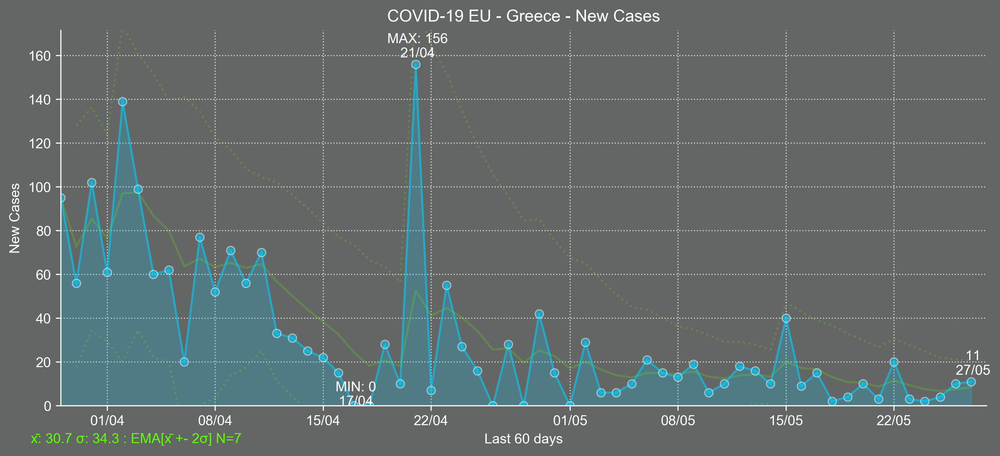

COVID-19 EU - Greece - New Cases.png


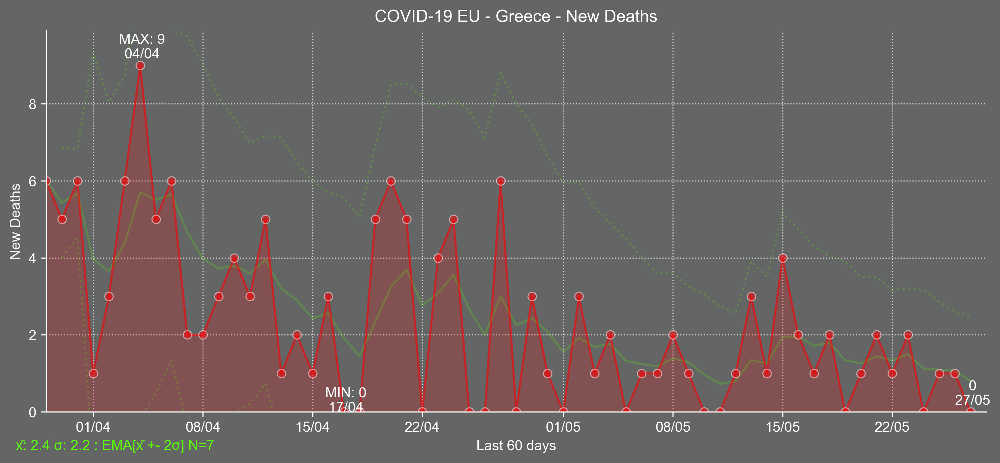

COVID-19 EU - Greece - New Deaths.png


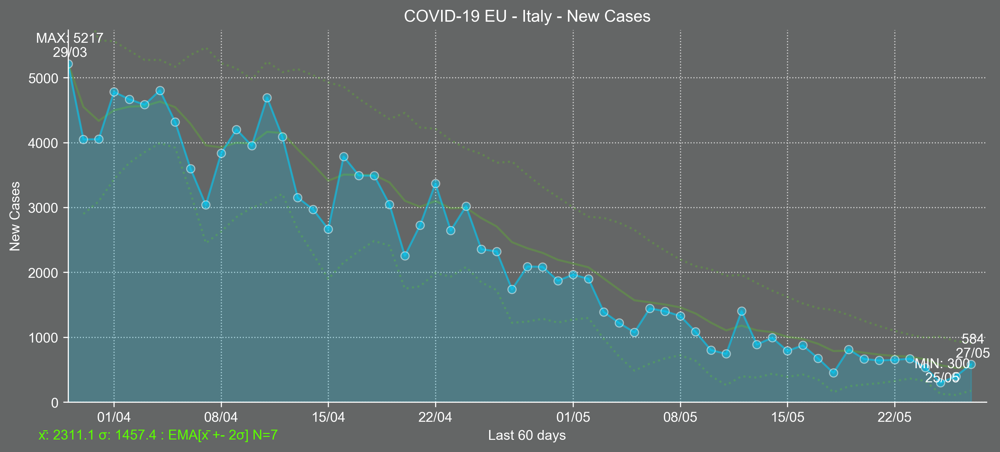

COVID-19 EU - Italy - New Cases.png


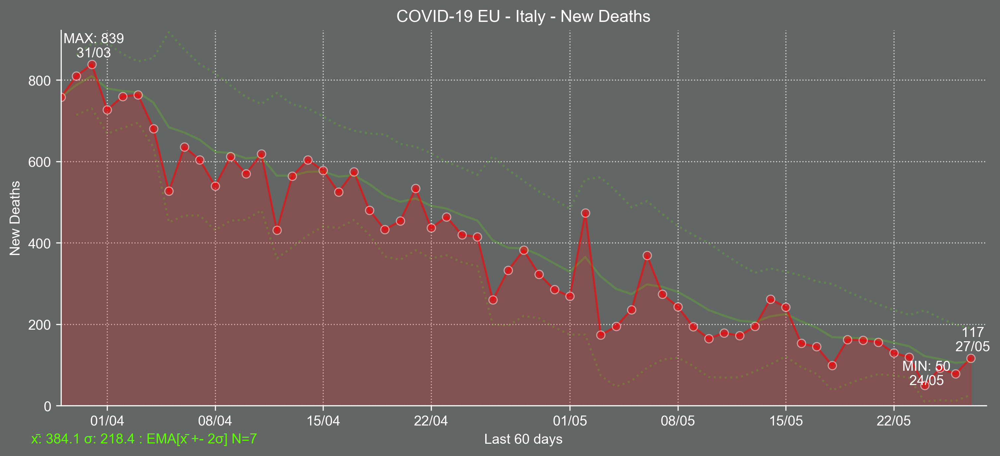

COVID-19 EU - Italy - New Deaths.png


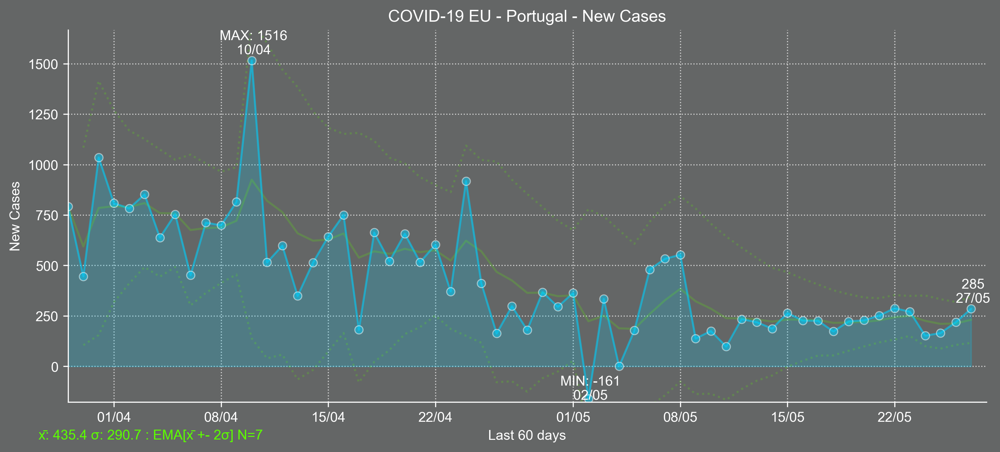

COVID-19 EU - Portugal - New Cases.png


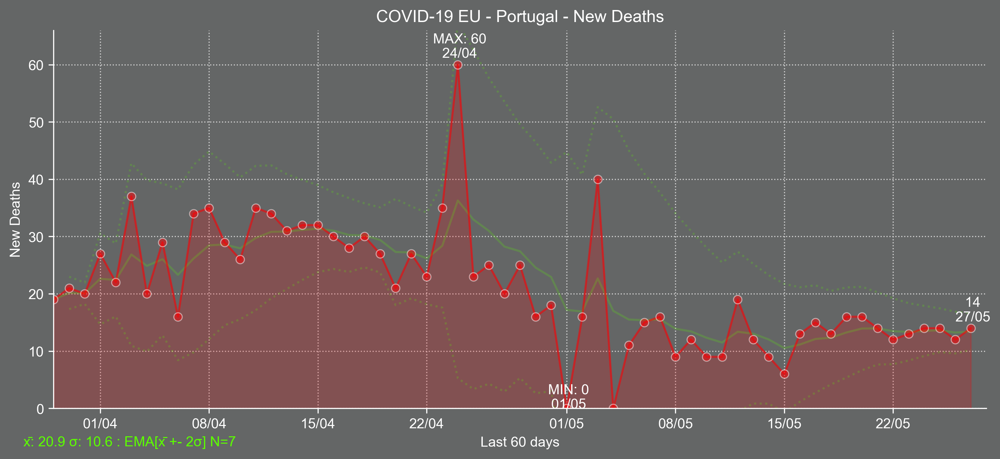

COVID-19 EU - Portugal - New Deaths.png


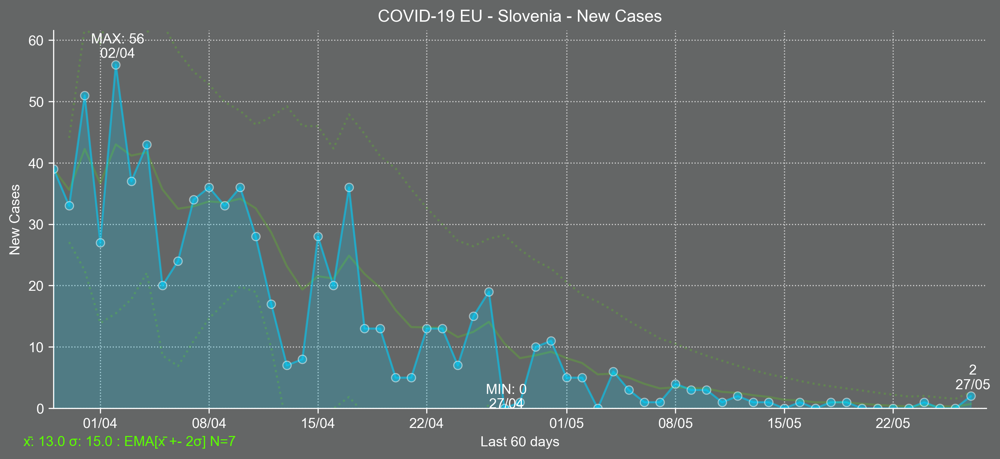

COVID-19 EU - Slovenia - New Cases.png


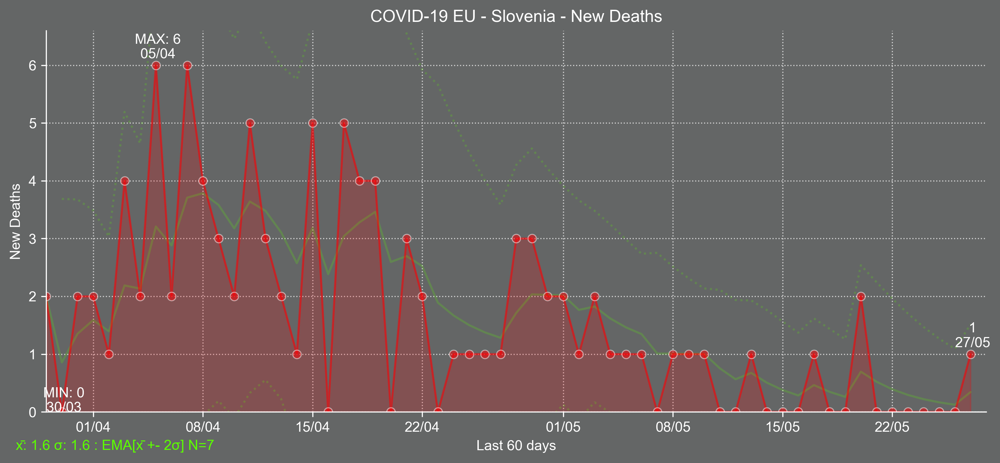

COVID-19 EU - Slovenia - New Deaths.png


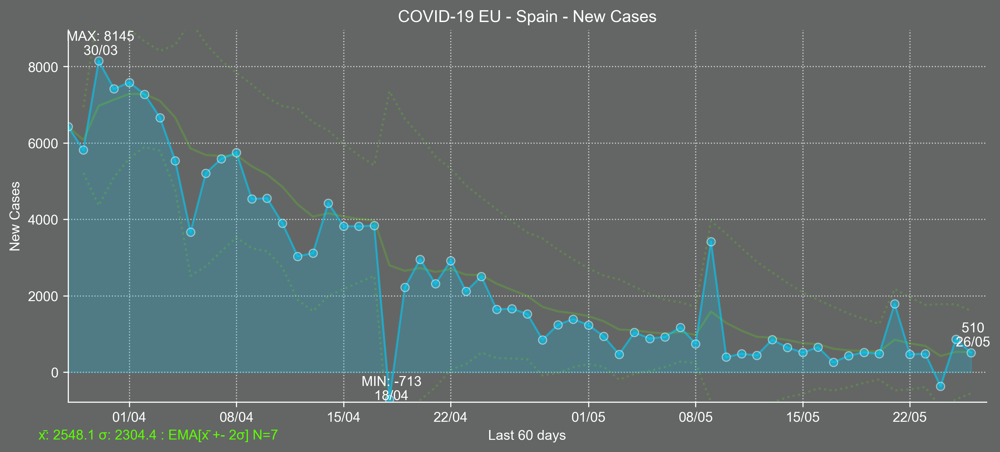

COVID-19 EU - Spain - New Cases.png


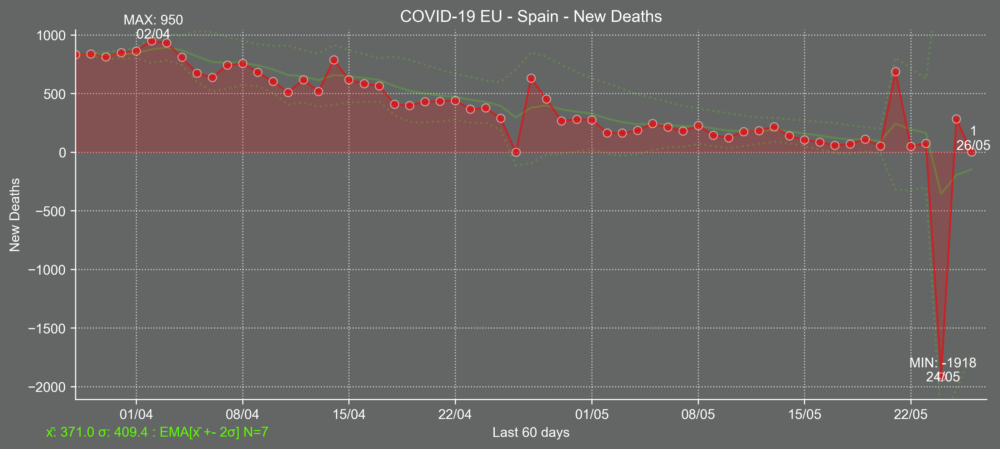

COVID-19 EU - Spain - New Deaths.png


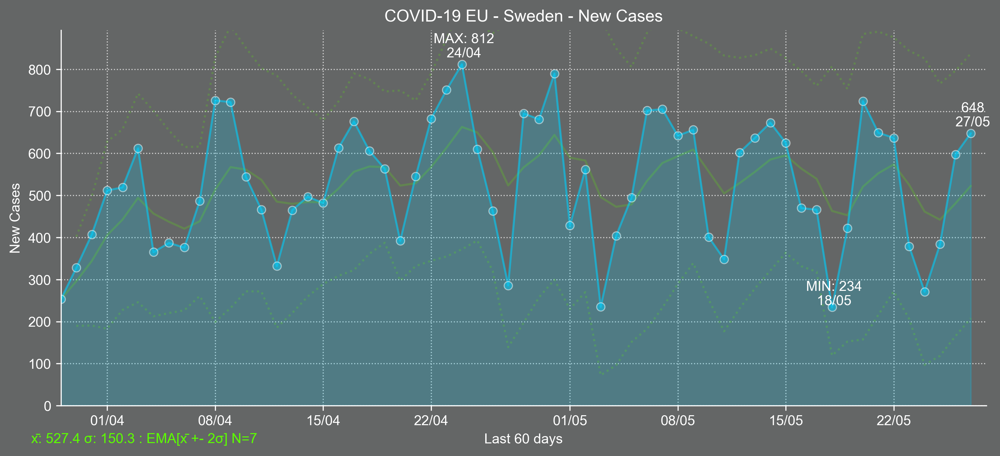

COVID-19 EU - Sweden - New Cases.png


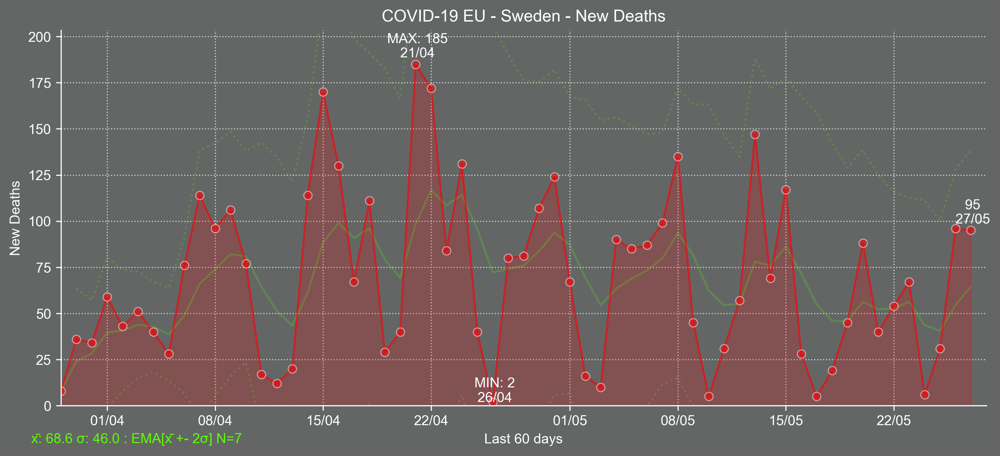

COVID-19 EU - Sweden - New Deaths.png


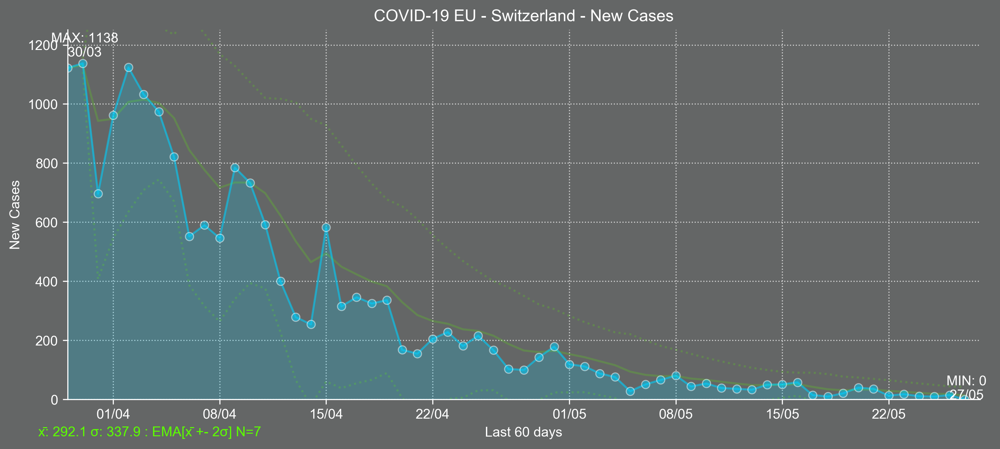

COVID-19 EU - Switzerland - New Cases.png


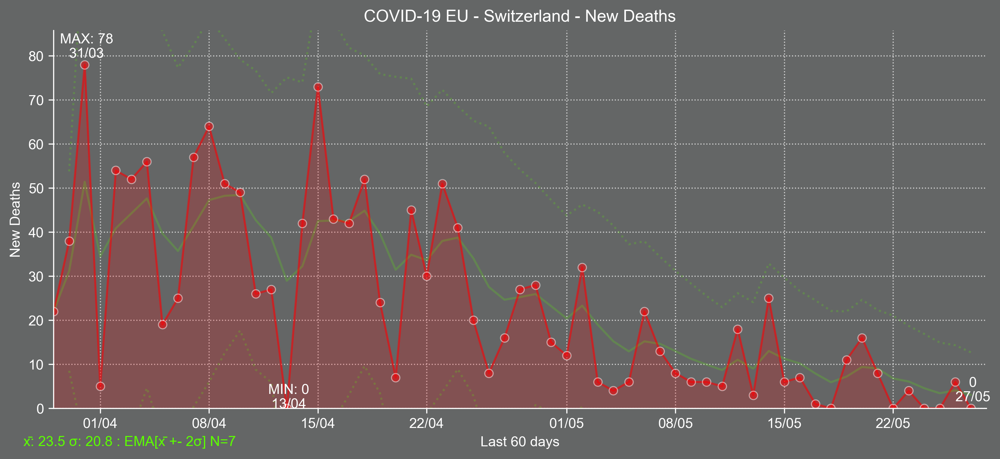

COVID-19 EU - Switzerland - New Deaths.png


In [13]:
# Show saved chart images with 300 dpi
import glob
from IPython.display import Image, display
for imageName in glob.glob('{}*.png'.format(s_title)): 
    display(Image(filename=imageName))
    print(imageName)

[]

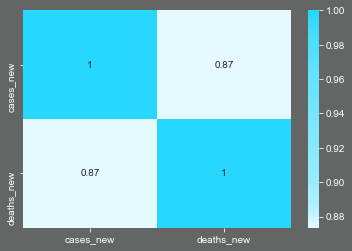

In [14]:
#Check correlation
from matplotlib.colors import LinearSegmentedColormap

boundaries = [0.0, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]  
hex_colors = sns.light_palette(d_confirmations['color'], n_colors=len(boundaries) * 2 + 2, as_cmap=False).as_hex()
hex_colors = [hex_colors[i] for i in range(0, len(hex_colors), 2)]
colors=list(zip(boundaries, hex_colors))
custom_color_map = LinearSegmentedColormap.from_list(
    name='custom_navy',
    colors=colors,
)


df_latest_corr = df_latest[[d_new_confirmations['key'],d_new_deaths['key']]].corr()
sns.heatmap(df_latest_corr,annot=True,cmap=custom_color_map)
plt.plot()

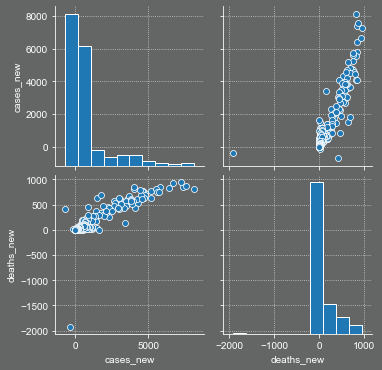

In [15]:
sns.pairplot(df_latest[[d_new_confirmations['key'],d_new_deaths['key']]])